In [1]:
DATA_DIR = '/storage/groups/ml01/workspace/louis.kuemmerle/projects/A1/data2/'
DATA_VERSION = 'april21'

In [3]:
import os 
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as pl

import scanpy as sc
import anndata as ann

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors


sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.7.5
scanpy      1.6.1
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              1.0.9
certifi             2020.12.05
cffi                1.14.4
chardet             4.0.0
cloudpickle         1.6.0
constants           NA
cycler              0.10.0
cython_runtime      NA
dask                2020.12.0
dateutil            2.8.1
decorator           4.4.2
future_fstrings     NA
get_version         2.1
google              NA
h5py                2.10.0
highs_wrapper       NA
idna                2.10
igraph              0.8.3
ipykernel           5.4.3
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.2
joblib              1.0.0
json5               NA
jsonschema          3.2.0
jupyter_server      1.2.1
jupyterlab_server   2.1.2
kiwisolver          1.3.1
legacy_api_wrap     1.2
leidenalg

In [4]:
sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 3
sc.settings.n_jobs = 3
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)

In [5]:
path_in = '/storage/groups/bcf/projects/SingleCell/10x/projects/ertuerk/MCAO_vs_sham/rev5/scanpy_AnnData/'

# Introduction

In this notebook, we preprocess Ali Ertürk's skull data. The full dataset consists of 24 samples from various sources in the mouse skeleton.

We perform the following steps:
1. Load the data
2. Run the QC metrics
3. Threshold and filter genes and cells
4. Save to file 

The following dictionary is extracted from the sample table and contains the origin of each sample (*i.e.* skull, pelvis, femur etc.) and the corresponding condition (MACO, Naive).

In [6]:
sample_origin = {'MUC12819' : 'Skull_MCAO_1', 
'MUC12820':'Pelvis_MCAO_1',
'MUC12821':'Femur_MCAO_1',
'MUC12822':'Meninges_MCAO_1',
'MUC12823':'Vertebra_MCAO_1',
'MUC12824':'Forearm_MCAO_1',
'MUC12825':'Shoulder_MCAO_1',
'MUC12826':'Brain_MCAO_1',
'MUC12827':'Skull_Sham_1',
'MUC12828':'Pelvis_Sham_1',
'MUC12829':'Femur_Sham_1',
'MUC12830':'Meninges_Sham_1',
'MUC12831':'Vertebra_Sham_1',
'MUC12832':'Forearm_Sham_1',
'MUC12833':'Shoulder_Sham_1',
'MUC12834':'Brain_Sham_1',                 
'MUC12835':'Skull_MCAO_2',
'MUC12836':'Pelvis_MCAO_2',
'MUC12837':'Femur_MCAO_2',
'MUC12838':'Meninges_MCAO_2',
'MUC12839':'Vertebra_MCAO_2',
'MUC12840':'Forearm_MCAO_2',
'MUC12841':'Shoulder_MCAO_2',
'MUC12842':'Brain_MCAO_2',
'MUC12843':'Skull_Naive_1',
'MUC12844':'Pelvis_Naive_1',
'MUC12845':'Femur_Naive_1',
'MUC12846':'Meninges_Naive_1',
'MUC12847':'Vertebra_Naive_1',
'MUC12848':'Forearm_Naive_1',
'MUC12849':'Shoulder_Naive_1',
'MUC12850':'Brain_Naive_1'}

# Read the data

In [6]:
files = os.listdir(path_in)

Check whether the sample_origin keys contain valid folder IDs.

In [7]:
for file_idx in sample_origin.keys():
    print(np.in1d(file_idx, files))

[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]


Use only the samples where we also have a key in the dictionary above.

In [8]:
adatas = list()
for file_idx in sample_origin.keys():
    adata_tmp = sc.read(path_in + file_idx + '/filtered_feature_bc_matrix.h5ad')
    adata_tmp.obs['sample_id'] = file_idx
    adatas.append(adata_tmp)

In [9]:
adata = ann.AnnData.concatenate(
    *adatas, 
    batch_key = 'batch'
).copy()

In [10]:
adata.obs['sample_id'].value_counts()

MUC12821    9821
MUC12823    8631
MUC12845    8463
MUC12849    7495
MUC12819    7442
MUC12844    7231
MUC12837    7167
MUC12848    7139
MUC12824    7135
MUC12828    6927
MUC12829    6886
MUC12820    6851
MUC12840    6555
MUC12836    6528
MUC12826    6520
MUC12839    5953
MUC12838    5818
MUC12825    5635
MUC12843    5397
MUC12832    5092
MUC12827    5020
MUC12833    4289
MUC12835    4114
MUC12847    3799
MUC12841    3757
MUC12842    3292
MUC12834    3011
MUC12850    2673
MUC12846    2473
MUC12831    2102
MUC12830    1393
MUC12822     515
Name: sample_id, dtype: int64

Add the sample origin to the info of the `anndata` object.

In [11]:
adata.obs['sample_id'] = adata.obs['sample_id'].astype('category')
adata.obs['sample_name'] = adata.obs['sample_id'].cat.rename_categories(sample_origin)  

In [12]:
region = [ term.split('_')[0] for term in adata.obs['sample_name']]
condition = [ term.split('_')[1] for term in adata.obs['sample_name']]

In [13]:
adata.obs['region'] = region
adata.obs['condition'] = condition

In [14]:
# Rename "Forearm" and "Shoulder" to correct names
region_rename = {   
    'Brain':'Brain',
    'Femur':'Femur',
    'Forearm':'Humerus',
    'Meninges':'Meninges',
    'Pelvis':'Pelvis',
    'Shoulder':'Scapula',
    'Skull':'Skull',
    'Vertebra':'Vertebra'
}
adata.obs['region'].replace(region_rename,inplace=True) 

In [15]:
pd.crosstab(adata.obs['region'], adata.obs['condition'])

condition,MCAO,Naive,Sham
region,,,
Brain,9812,2673,3011
Femur,16988,8463,6886
Humerus,13690,7139,5092
Meninges,6333,2473,1393
Pelvis,13379,7231,6927
Scapula,9392,7495,4289
Skull,11556,5397,5020
Vertebra,14584,3799,2102


In [17]:
sc.write(adata=adata, filename = DATA_DIR+f'data_merged_{DATA_VERSION}_wSham.h5ad')

... storing 'region' as categorical
... storing 'condition' as categorical


In [7]:
adata = sc.read(DATA_DIR+f'data_merged_{DATA_VERSION}_wSham.h5ad')

# Quality control

In this section, we compute the quality metrics, namely the number of counts, the number of genes detected, the percentage of mitochondrial reads.

In [8]:
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log10(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)
mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
mt_gene_index = np.where(mt_gene_mask)[0]
adata.obs['mt_fraction'] = adata.X[:,mt_gene_index].sum(1) / adata.X.sum(1)

Plot QC metrics.

/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


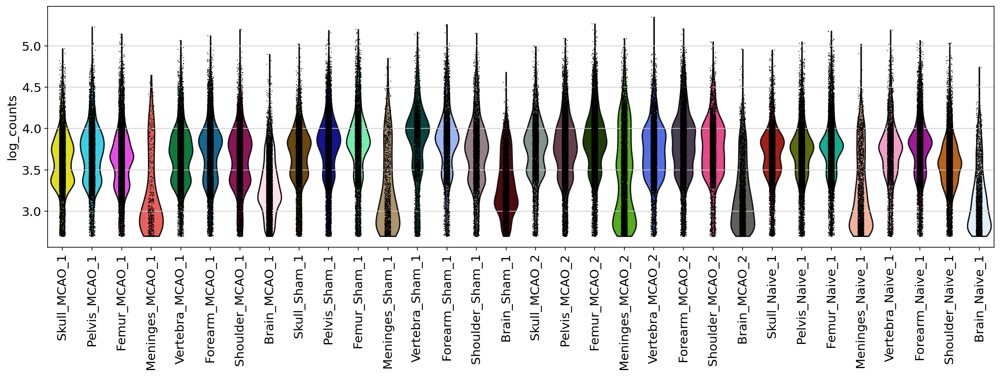

/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


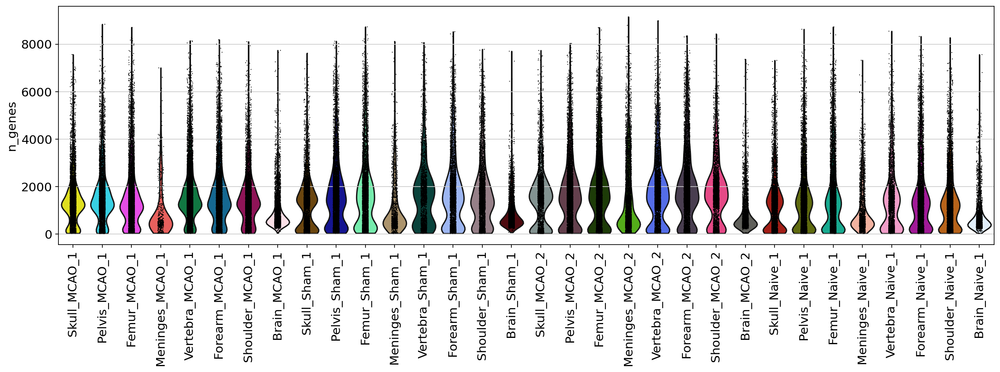

/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


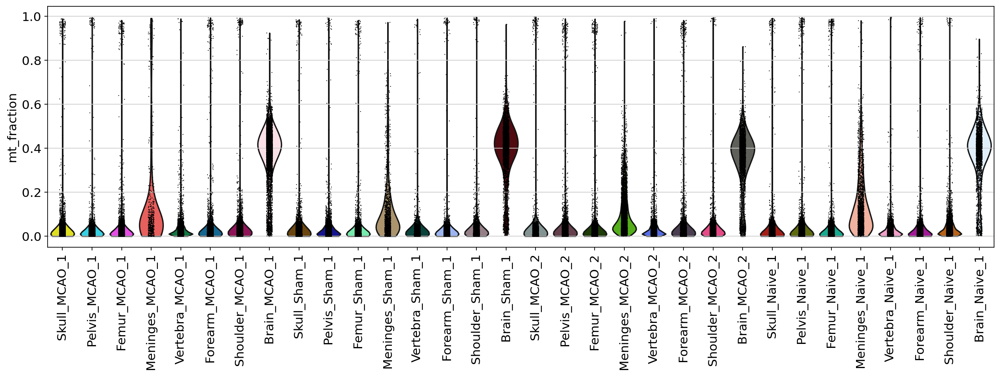

In [9]:
rcParams['figure.figsize']= (15,5)
sc.pl.violin(adata, ['log_counts'], groupby='sample_name', size=1, log=False,rotation=90)
sc.pl.violin(adata, ['n_genes'], groupby='sample_name', size=1, log=False,rotation=90)
sc.pl.violin(adata, ['mt_fraction'], groupby='sample_name', size=1, log=False,rotation=90)

We observe distinct patterns for each sample, especially the mitochondrial fraction of the brain samples is high compared to the other samples, and the library size for the meningeal cells is lower overall compared to the other cells. Thus, we have to apply different filters per sample.

Let us visualise the QC metric in a scatter plot.

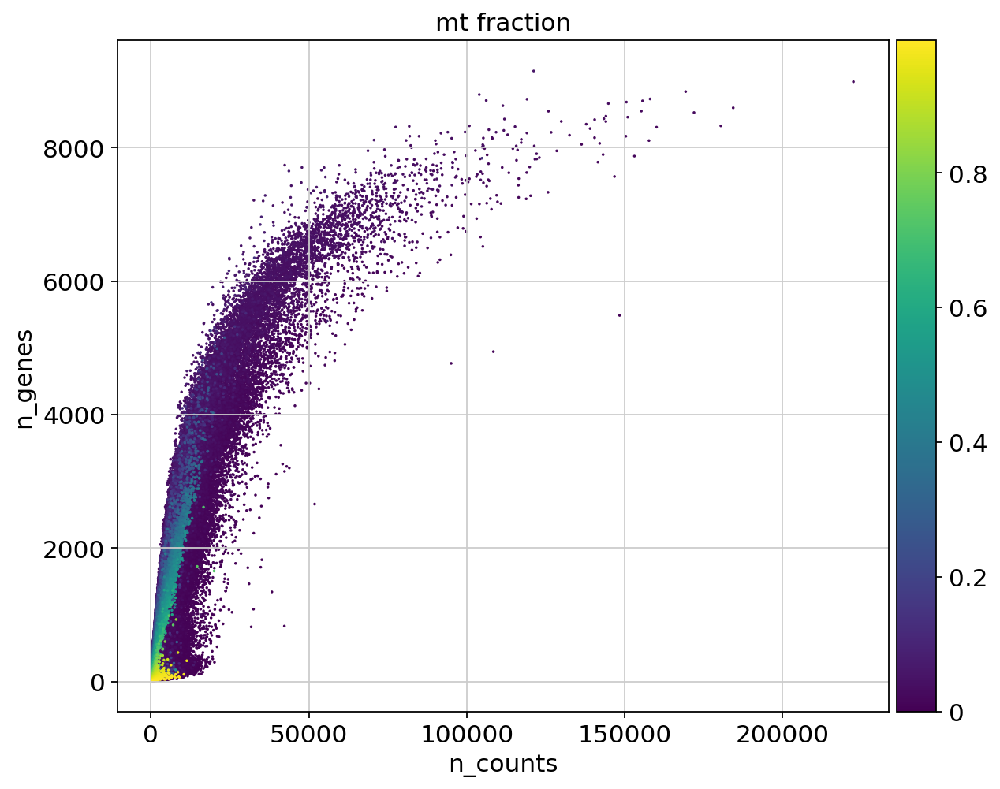

In [10]:
rcParams['figure.figsize']=(7,7)
sc.pl.scatter(adata,
              y='n_genes',x='n_counts', color='mt_fraction', size = 10, show=False)

/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


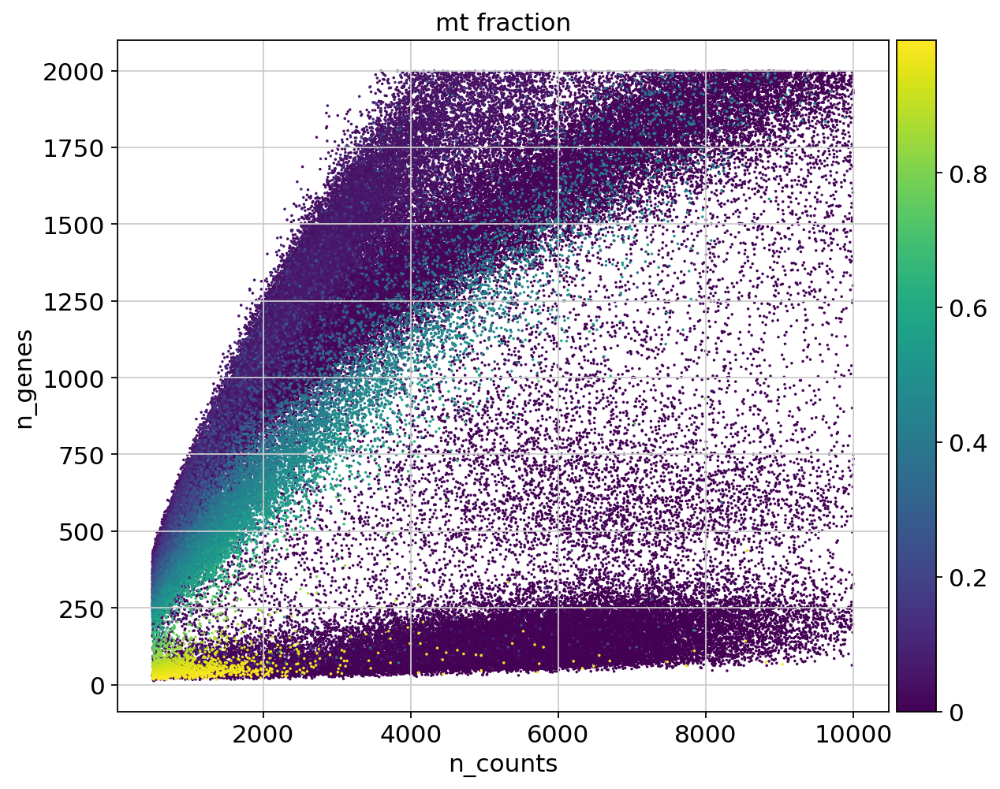

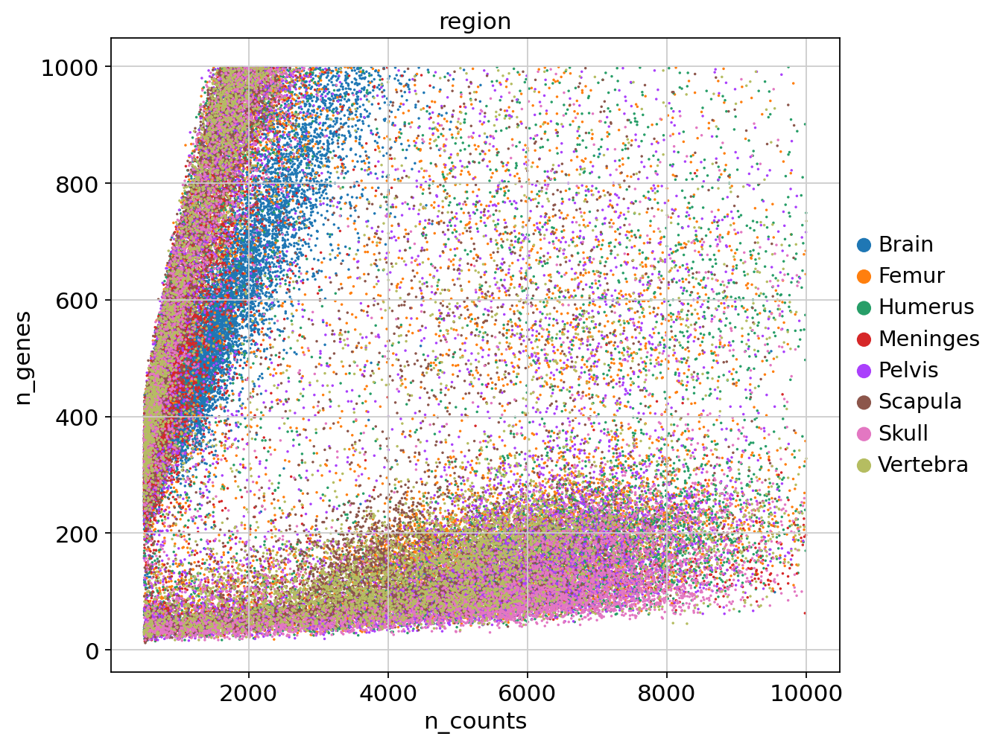

In [11]:
sc.pl.scatter(adata[np.logical_and(adata.obs['n_genes']<2000, adata.obs['n_counts']<10000)],
              y='n_genes',x='n_counts', color='mt_fraction', size = 10, show=False)
sc.pl.scatter(adata[np.logical_and(adata.obs['n_genes']<1000, adata.obs['n_counts']<10000)],
              y='n_genes',x='n_counts', color='region', size = 10, show=False)

Interestingly, we observe a large population with low number of genes and sufficient number of UMI counts. We keep those cells for now and reveal their identify in the downstream analysis.

## cell filtering

We start with the mitochondrial reads filter. Here, we apply a filter of 0.3 for meningeal samples and brain samples, and a strict filter of 0.2 for all other regions.

In [12]:
adata_tmp = adata.copy()

In [13]:
#Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_tmp.n_obs))

#get filter idx
high_mt = adata_tmp.obs['mt_fraction'] < 0.2
high_mt[adata_tmp.obs['region']=='Meninges'] = (adata_tmp.obs['mt_fraction'][adata_tmp.obs['region']=='Meninges'] < 0.3).values
high_mt[adata_tmp.obs['region']=='Brain'] = (adata_tmp.obs['mt_fraction'][adata_tmp.obs['region']=='Brain'] < 0.3).values

adata_tmp = adata_tmp[np.where(high_mt)[0]]
print('Number of cells after MT filter: {:d}'.format(adata_tmp.n_obs))

Total number of cells: 175124
Number of cells after MT filter: 159648


/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Next, we filter for the number of expressed UMI counts. Here, we see again a different distribution for brain and meninges samples compared to all other samples. 
We try, a minimum of total counts of 500 for all other samples, and 1,000 for all other samples.

In [14]:
#get filter idx
low_count = adata_tmp.obs['n_counts'] > 500
low_count[np.invert(np.in1d(adata_tmp.obs['region'], 
                  ['Meninges', 'Brain']))] = adata_tmp.obs['n_counts'][np.invert(np.in1d(adata_tmp.obs['region'].values, 
                  ['Meninges', 'Brain']))] > 1000


adata_tmp = adata_tmp[np.where(low_count)[0]]
print('Number of cells after minimum counts filter: {:d}'.format(adata_tmp.n_obs))

sc.pp.filter_cells(adata_tmp, max_counts=50000)
print('Number of cells after maximum count filter: {:d}'.format(adata_tmp.n_obs))

/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Number of cells after minimum counts filter: 153414
filtered out 1298 cells that have more than 50000 counts


Trying to set attribute `.obs` of view, copying.


Number of cells after maximum count filter: 152116


Concerning the number of genes filtering, we decided to skip any additional filtering because we observe a low genes high counts population that we would like to keep.

In [15]:
#get filter idx
#low_genes = adata_tmp.obs['n_genes'] > 500
#low_genes[adata_tmp.obs['region']=='Meninges'] = adata_tmp.obs['n_genes'][adata_tmp.obs['region']=='Meninges'] > 200
#low_genes[adata_tmp.obs['region']=='Brain'] = adata_tmp.obs['n_genes'][adata_tmp.obs['region']=='Brain'] > 400

#adata_tmp = adata_tmp[low_genes]
#print('Number of cells after number of expressed genes filter: {:d}'.format(adata_tmp.n_obs))

## gene filter

Next, we filter out all genes that are expressed in less than 10 cells.

In [16]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata_tmp.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata_tmp, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata_tmp.n_vars))

Total number of genes: 22597
filtered out 5496 genes that are detected in less than 10 cells
Number of genes after cell filter: 17101


## Doublet detection

Here, we aim to estimate doublets from the data using `scrublet`.    
Note: `scrublet` requires the module `annoy`. Running `scrublet` crashes for recent versions of `annoy` --> downgrade to version 1.11.5:    
- check current version: `pip show annoy`
- `pip uninstall annoy` (might also work without uninstalling)
- `pip install annoy==1.11.5`

In [1]:
import scrublet as scr
import scipy.io
import time

In [18]:
adata_tmp.obs['doublet_score']= np.zeros(adata_tmp.shape[0])
adata_tmp.obs['doublet'] = np.zeros(adata_tmp.shape[0])

In [19]:
# filtering/preprocessing parameters:
min_counts = 2
min_cells = 3
vscore_percentile = 85
n_pc = 50

# doublet detector parameters:
expected_doublet_rate = 0.02 
sim_doublet_ratio = 3
n_neighbors = 15

for batch in enumerate(adata_tmp.obs['sample_id'].cat.categories):
    t0 = time.time()
    idx = np.flatnonzero(adata_tmp.obs['sample_id']==batch[1])
    scrub = scr.Scrublet(counts_matrix = adata_tmp[idx,:].X,  
                     n_neighbors = n_neighbors,
                     sim_doublet_ratio = sim_doublet_ratio,
                     expected_doublet_rate = expected_doublet_rate)
    doublet_scores, predicted_doublets = scrub.scrub_doublets( 
                    min_counts = min_counts, 
                    min_cells = min_cells, 
                    n_prin_comps = n_pc,
                    use_approx_neighbors = True, 
                    get_doublet_neighbor_parents = False)
    adata_tmp.obs['doublet_score'].iloc[idx] = doublet_scores
    adata_tmp.obs['doublet'].iloc[idx] = predicted_doublets
    t1 = time.time()
    print('Elapsed time: {:.1f} seconds'.format(t1 - t0))

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 4.5%
Estimated detectable doublet fraction = 59.3%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 7.5%
Elapsed time: 20.8 seconds
Elapsed time: 21.9 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 5.2%
Estimated detectable doublet fraction = 61.6%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.4%
Elapsed time: 24.7 seconds
Elapsed time: 25.9 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 23.1%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.6%
Elapsed time: 26.1 seconds
Elapsed time: 26.9 seconds
Preprocessing...
Simulating doublets...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 0.6%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 37.5%
Elapsed time: 1.0 seconds
Elapsed time: 1.1 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 6.1%
Estimated detectable doublet fraction = 62.2%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 9.7%
Elapsed time: 22.9 seconds
Elapsed time: 23.6 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 31.9%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 6.3%
Elapsed time: 20.1 seconds
Elapsed time: 20.8 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 3.4%
Estimated detectable doublet fraction = 59.3%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 5.7%
Elapsed time: 13.5 seconds
Elapsed time: 14.0 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 2.9%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 3.1%
Elapsed time: 3.3 seconds
Elapsed time: 3.4 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 3.4%
Estimated detectable doublet fraction = 59.3%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 5.7%
Elapsed time: 11.2 seconds
Elapsed time: 11.5 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 4.3%
Estimated detectable doublet fraction = 55.4%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 7.8%
Elapsed time: 18.9 seconds
Elapsed time: 19.5 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 28.1%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 7.2%
Elapsed time: 15.3 seconds
Elapsed time: 16.0 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 10.2%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 1.6%
Elapsed time: 4.7 seconds
Elapsed time: 4.8 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.13
Detected doublet rate = 1.3%
Estimated detectable doublet fraction = 40.1%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 3.2%
Elapsed time: 4.8 seconds
Elapsed time: 5.0 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.13
Detected doublet rate = 1.7%
Estimated detectable doublet fraction = 37.4%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 4.5%
Elapsed time: 11.5 seconds
Elapsed time: 11.9 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 32.2%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 6.2%
Elapsed time: 10.3 seconds
Elapsed time: 10.9 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 3.5%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 0.0%
Elapsed time: 1.5 seconds
Elapsed time: 1.6 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.09
Detected doublet rate = 2.8%
Estimated detectable doublet fraction = 57.7%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 4.9%
Elapsed time: 8.8 seconds
Elapsed time: 9.1 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 4.7%
Estimated detectable doublet fraction = 55.8%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.4%
Elapsed time: 23.0 seconds
Elapsed time: 23.5 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 4.5%
Estimated detectable doublet fraction = 55.3%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.2%
Elapsed time: 18.0 seconds
Elapsed time: 18.6 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 12.8%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 6.9%
Elapsed time: 18.6 seconds
Elapsed time: 19.2 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 3.5%
Estimated detectable doublet fraction = 59.0%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 6.0%
Elapsed time: 16.9 seconds
Elapsed time: 17.9 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.08
Detected doublet rate = 4.2%
Estimated detectable doublet fraction = 58.1%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 7.2%
Elapsed time: 20.6 seconds
Elapsed time: 22.0 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.12
Detected doublet rate = 2.2%
Estimated detectable doublet fraction = 52.8%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 4.1%
Elapsed time: 11.8 seconds
Elapsed time: 12.2 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 1.9%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 14.3%
Elapsed time: 1.9 seconds
Elapsed time: 2.0 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.09
Detected doublet rate = 2.7%
Estimated detectable doublet fraction = 53.1%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 5.1%
Elapsed time: 12.0 seconds
Elapsed time: 12.4 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 4.8%
Estimated detectable doublet fraction = 55.6%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.6%
Elapsed time: 16.6 seconds
Elapsed time: 17.1 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 23.7%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.7%
Elapsed time: 22.1 seconds
Elapsed time: 22.7 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 0.8%
Estimated detectable doublet fraction = 13.9%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 5.7%
Elapsed time: 9.0 seconds
Elapsed time: 9.1 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 1.8%
Estimated detectable doublet fraction = 35.9%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 5.0%
Elapsed time: 13.5 seconds
Elapsed time: 14.0 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 4.7%
Estimated detectable doublet fraction = 55.7%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 8.4%
Elapsed time: 29.9 seconds
Elapsed time: 31.0 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 5.6%
Estimated detectable doublet fraction = 62.8%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 9.0%
Elapsed time: 28.3 seconds
Elapsed time: 29.5 seconds
Preprocessing...


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.11
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.7%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 0.0%
Elapsed time: 1.3 seconds
Elapsed time: 1.5 seconds


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='doublet_score'>

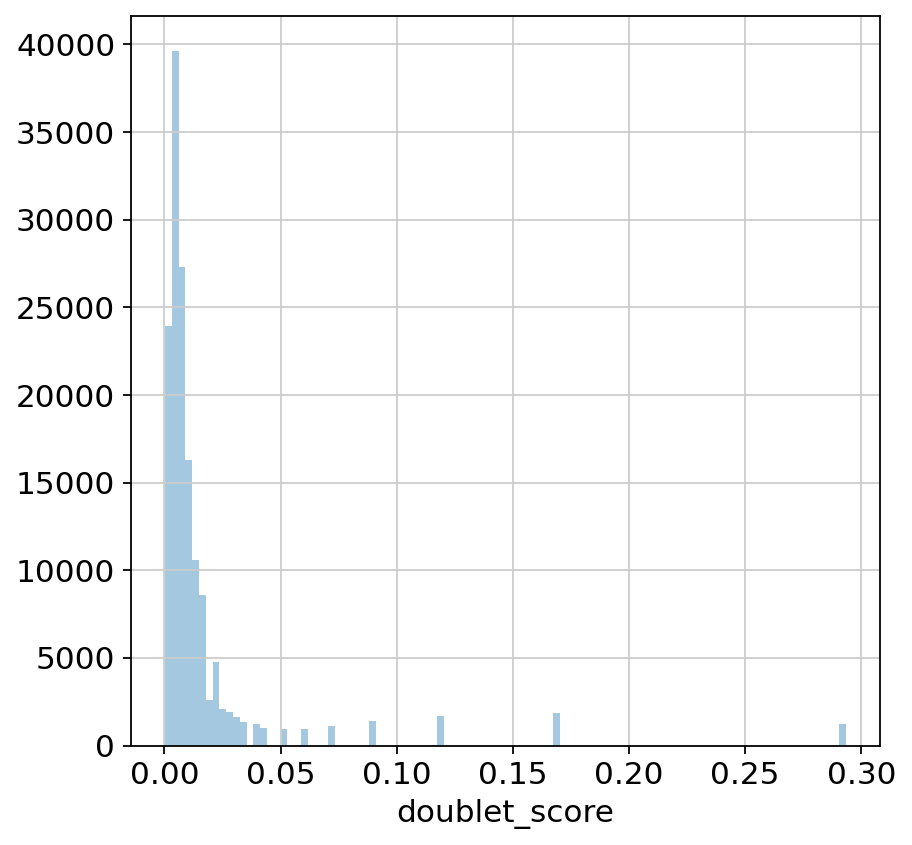

In [20]:
rcParams['figure.figsize']=(6,6)
sb.distplot(adata_tmp.obs['doublet_score'], bins=100, kde=False)

### filter doublets

Scrublet proposed a different threshold than we would choose based upon the histogram plot of the doublet scores.

In [21]:
thr = 0.1
ix_filt = adata_tmp.obs['doublet_score']<=thr

adata_tmp = adata_tmp[ix_filt].copy()
print('Number of cells after doublet filter: {:d}'.format(adata_tmp.n_obs))

/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Number of cells after doublet filter: 147347


# QC after filtering

... storing 'doublet' as categorical
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


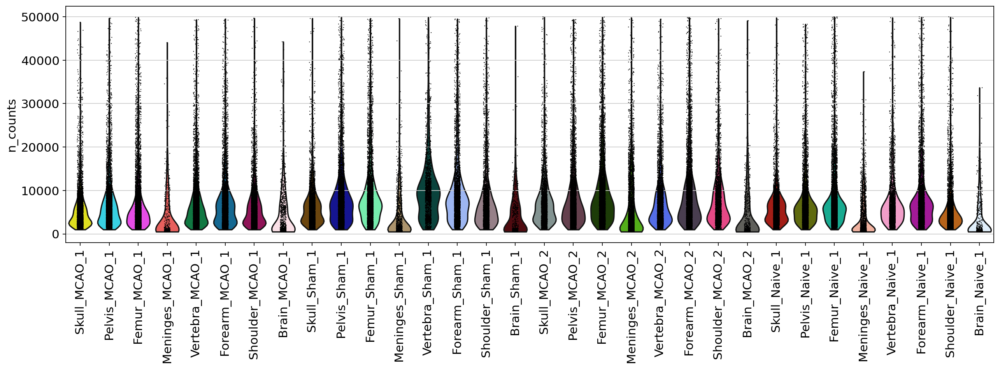

/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


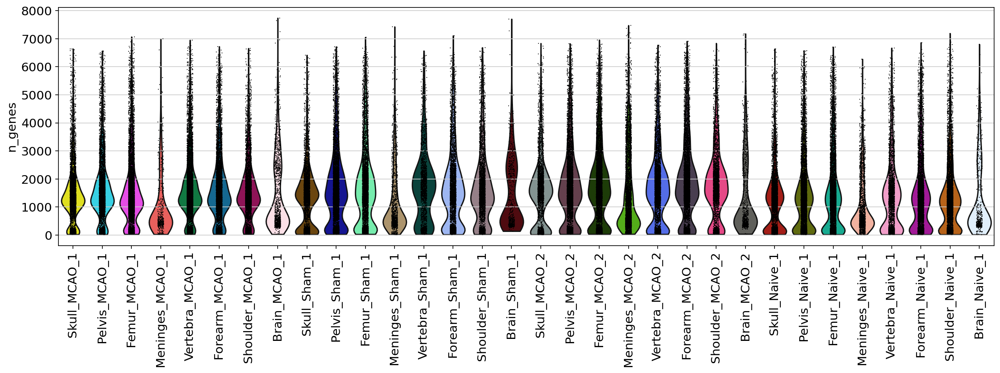

/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


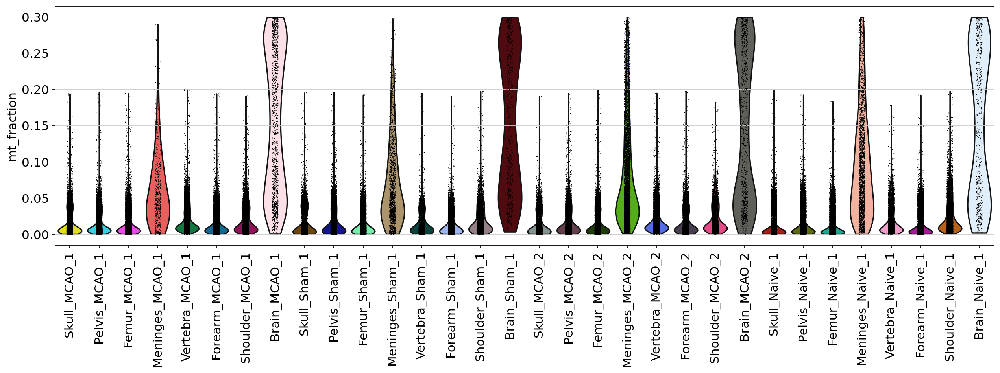

,mean_genes,median_genes,mean_counts,median_counts
sample_name,,,,
Skull_MCAO_1,1395.303957,1268.0,5444.382324,4083.5
Pelvis_MCAO_1,1601.222275,1370.5,6659.415039,5118.0
Femur_MCAO_1,1499.144595,1238.0,6201.237305,4402.5
Meninges_MCAO_1,1048.566079,521.5,3814.308350,1089.0
Vertebra_MCAO_1,1647.172802,1405.5,6382.531738,4848.5
Forearm_MCAO_1,1642.532674,1391.0,7282.644043,5782.0
Shoulder_MCAO_1,1569.863132,1379.0,6208.501465,4848.0
Brain_MCAO_1,1503.829020,840.0,4744.314941,1913.0
Skull_Sham_1,1327.887254,1359.0,6346.813477,5339.0


In [22]:
rcParams['figure.figsize']= (15,5)
sc.pl.violin(adata_tmp, ['n_counts'], 
             groupby='sample_name', size=1, log=False,rotation=90)
sc.pl.violin(adata_tmp, ['n_genes'], 
             groupby='sample_name', size=1, log=False,rotation=90)
sc.pl.violin(adata_tmp, ['mt_fraction'], 
             groupby='sample_name', size=1, log=False,rotation=90)

df = adata_tmp.obs[['n_genes','n_counts','sample_name']]
df_all = pd.DataFrame(df.groupby(by='sample_name')['n_genes'].apply(np.mean).values,
                      index=df.groupby(by='sample_name')['n_genes'].apply(np.mean).index,
                      columns=['mean_genes'])

df_all['median_genes']=df.groupby(by='sample_name')['n_genes'].apply(np.median).values
df_all['mean_counts']=df.groupby(by='sample_name')['n_counts'].apply(np.mean).values
df_all['median_counts']=df.groupby(by='sample_name')['n_counts'].apply(np.median).values
df_all

## Visual sanity check 

Before we proceed with the scran normalisation, we should remove remaining outliers and low quality cells, which have not been detected and or filtered, yet. 

In [23]:
sc.pp.normalize_total(adata_tmp,target_sum = 1e4)
sc.pp.log1p(adata_tmp)

normalizing counts per cell
    finished (0:00:04)


In [24]:
sc.tl.pca(adata_tmp, svd_solver='arpack')
sc.pp.neighbors(adata_tmp)

computing PCA
    with n_comps=50
    finished (0:04:56)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:03:38)


In [25]:
sc.tl.leiden(adata_tmp, resolution=0.5)
sc.tl.umap(adata_tmp)

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:44)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:40)


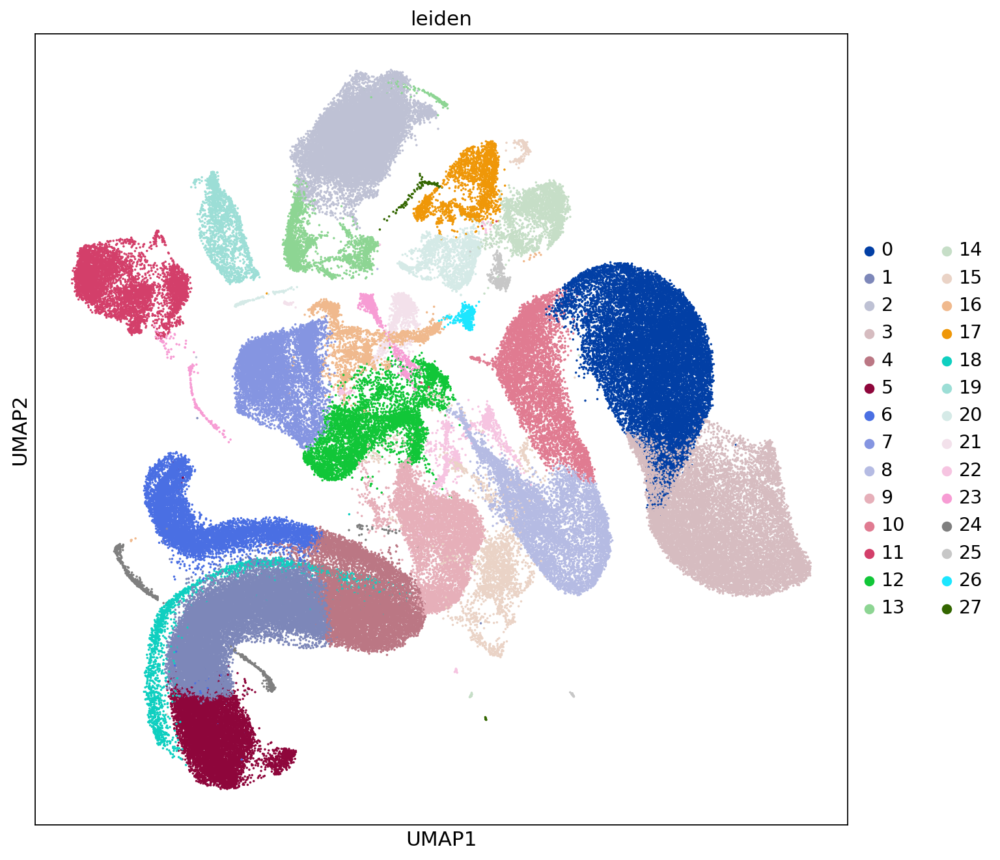

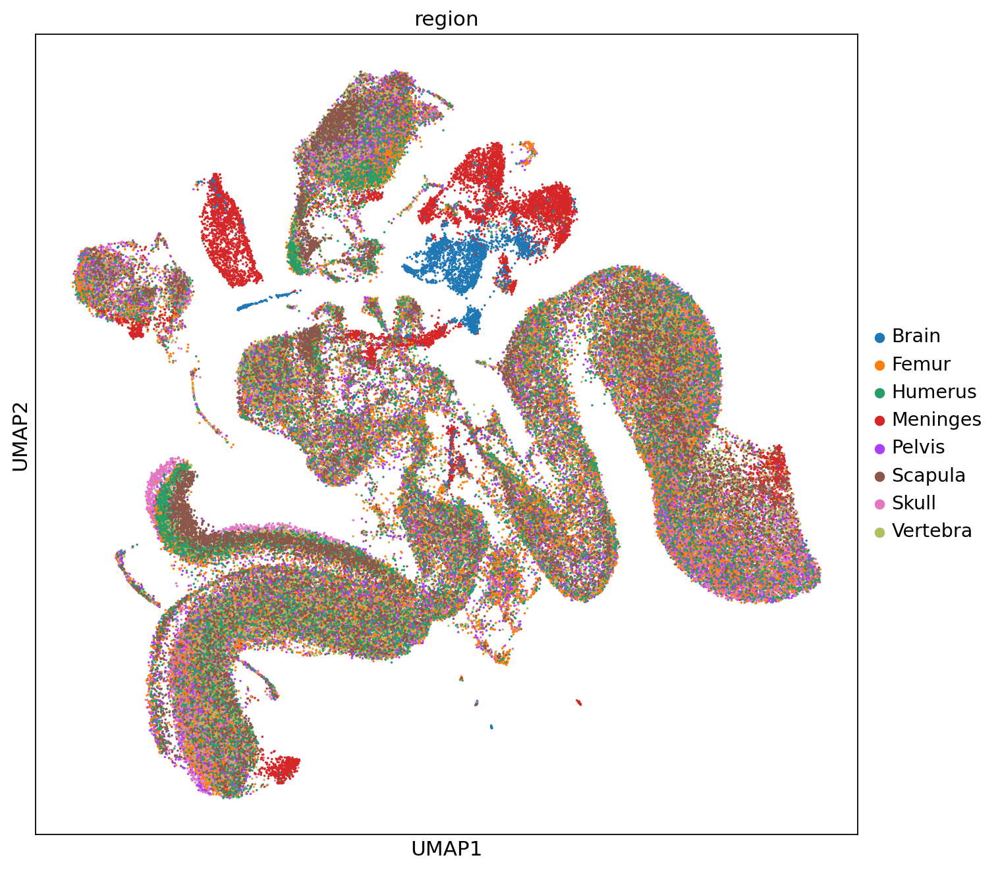

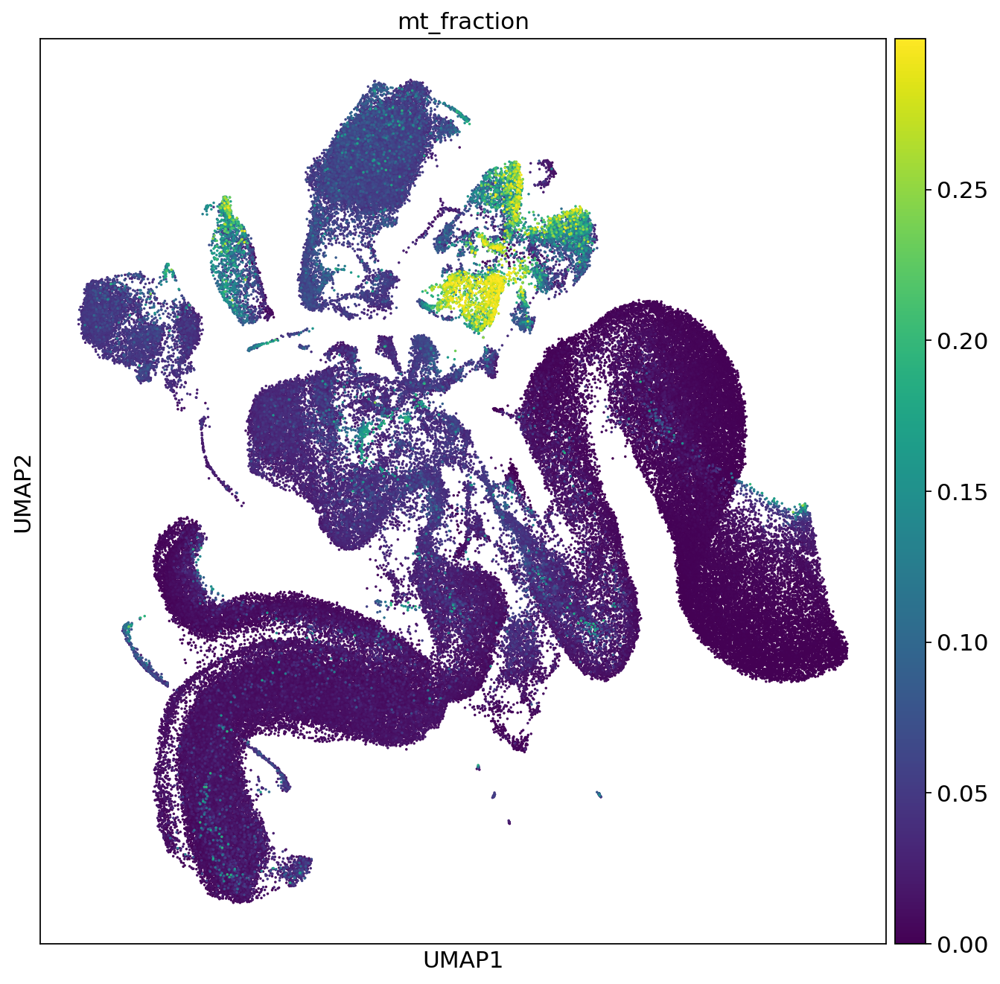

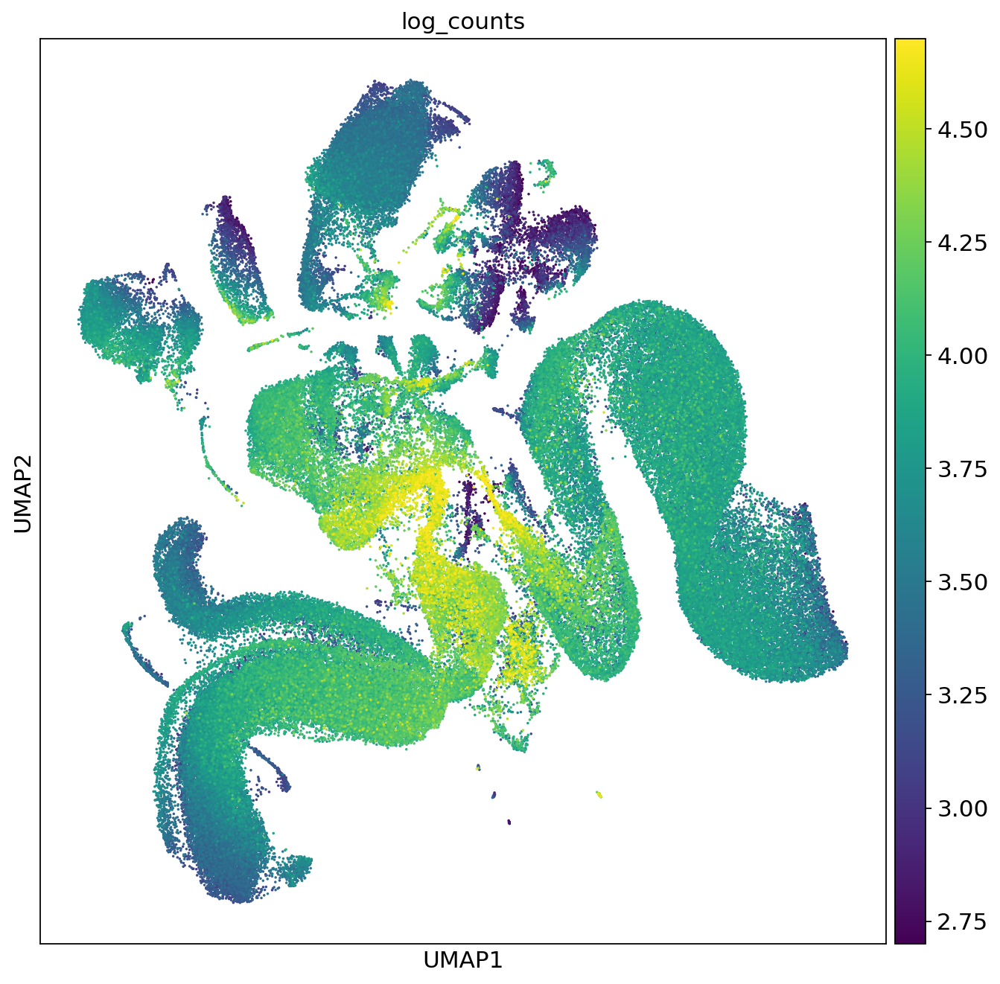

In [26]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_tmp, color='leiden', size=10)
sc.pl.umap(adata_tmp, color='region', size=10)
sc.pl.umap(adata_tmp, color='mt_fraction', size=10)
sc.pl.umap(adata_tmp, color='log_counts', size=10)

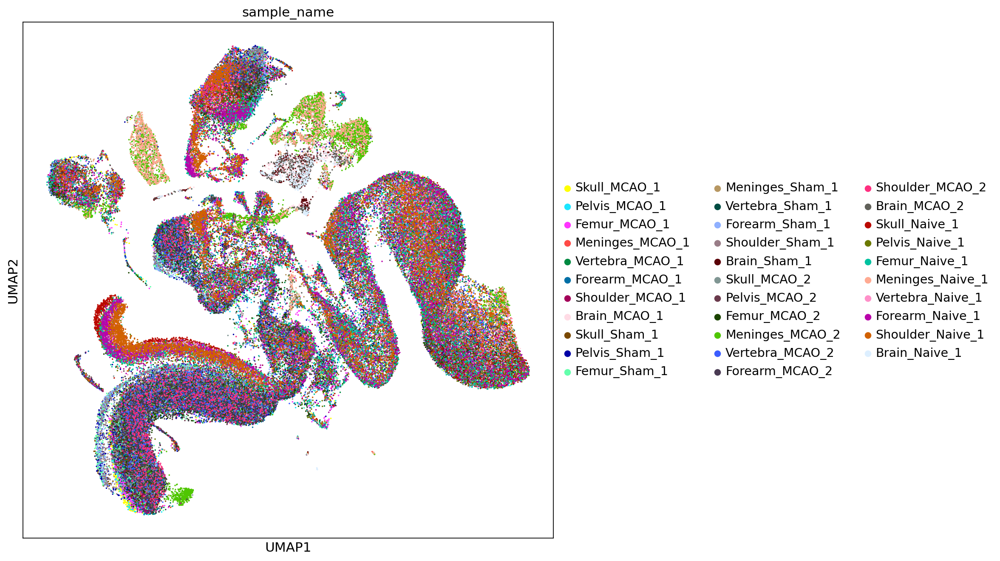

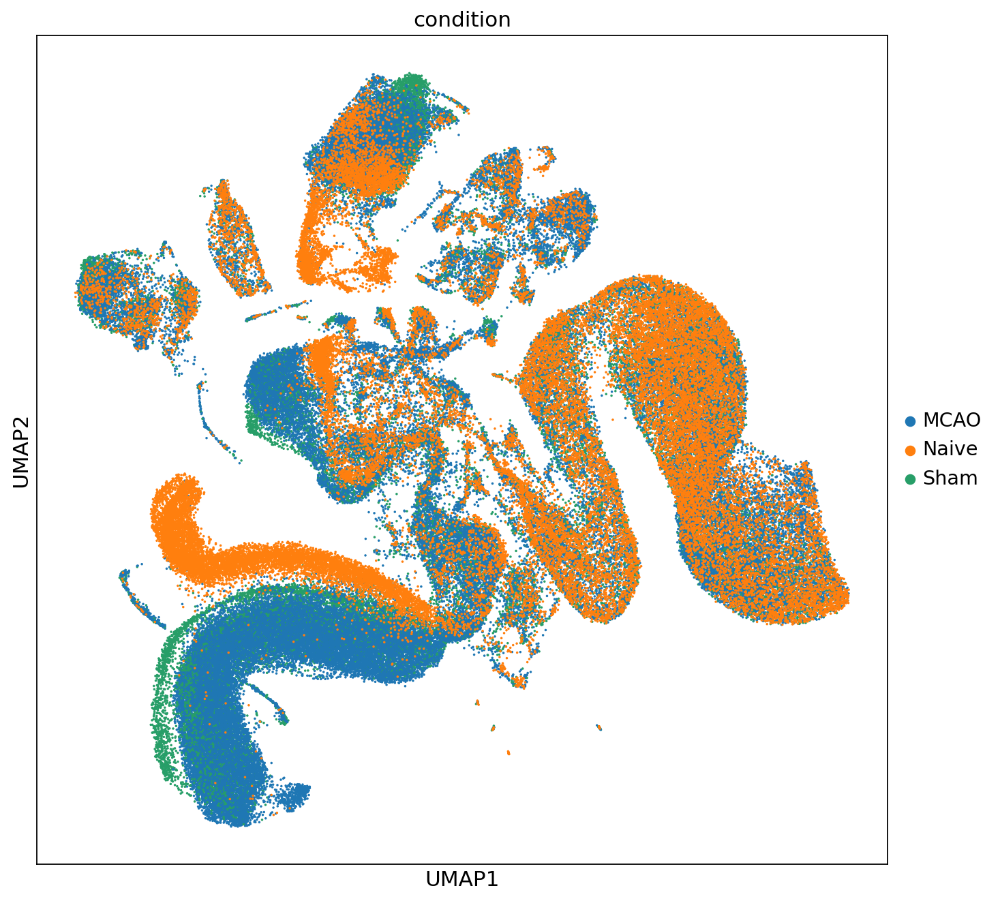

In [27]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_tmp, color='sample_name', size=10)
sc.pl.umap(adata_tmp, color='condition', size=10)

# Filter count data and save to file

Filter `adata` to the same cells and genes as `adata_tmp`, then save to file to apply normalisation in the next notebook.

In [28]:
adata = adata[np.in1d(adata.obs_names, adata_tmp.obs_names)]

/opt/python/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [29]:
adata = adata[:,np.in1d(adata.var_names, adata_tmp.var_names)]

In [30]:
adata

View of AnnData object with n_obs × n_vars = 147347 × 17101
    obs: 'sample_id', 'batch', 'sample_name', 'region', 'condition', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction'
    uns: 'sample_name_colors'

In [31]:
adata_tmp.write(filename=DATA_DIR+f'tmp_{DATA_VERSION}_wSham.h5ad')

In [32]:
adata.write(filename=DATA_DIR+f'adata_counts_postQC_{DATA_VERSION}_wSham.h5ad')